# Title: BANK MARKETING ANALYSIS

<h1 style="font-weight: bold; color: white;">HANNAN MUZAMMIL</h1>

[![GitHub](https://img.shields.io/badge/GitHub-Profile-blue?style=for-the-badge&logo=github)](https://github.com/han023) 
[![Kaggle](https://img.shields.io/badge/Kaggle-Profile-blue?style=for-the-badge&logo=kaggle)](https://www.kaggle.com/hannanmuzammil)

### **Meta-Data (About Dataset)**
The data is related with direct marketing campaigns of a Portuguese banking institution. The marketing campaigns were based on phone calls. Often, more than one contact to the same client was required, in order to access if the product (bank term deposit) would be ('yes') or not ('no') subscribed. 

There are four datasets: 
1) bank-additional-full.csv with all examples (41188) and 20 inputs, ordered by date (from May 2008 to November 2010), very close to the data analyzed in [Moro et al., 2014]
2) bank-additional.csv with 10% of the examples (4119), randomly selected from 1), and 20 inputs.
3) bank-full.csv with all examples and 17 inputs, ordered by date (older version of this dataset with less inputs). 
4) bank.csv with 10% of the examples and 17 inputs, randomly selected from 3 (older version of this dataset with less inputs). 
The smallest datasets are provided to test more computationally demanding machine learning algorithms (e.g., SVM). 

The classification goal is to predict if the client will subscribe (yes/no) a term deposit (variable y).

### **Column Descriptions:**
#### bank client data:
* 1 - age (numeric)
* 2 - job : type of job (categorical: "admin.","unknown","unemployed","management","housemaid",     "entrepreneur","student","blue-collar","self-employed","retired","technician","services") 
* 3 - marital : marital status (categorical: "married","divorced","single"; note: "divorced" means divorced or widowed)
* 4 - education (categorical: "unknown","secondary","primary","tertiary")
* 5 - default: has credit in default? (binary: "yes","no")
* 6 - balance: average yearly balance, in euros (numeric) 
* 7 - housing: has housing loan? (binary: "yes","no")
* 8 - loan: has personal loan? (binary: "yes","no")
#### related with the last contact of the current campaign:
* 9 - contact: contact communication type (categorical: "unknown","telephone","cellular") 
* 10 - day: last contact day of the month (numeric)
* 11 - month: last contact month of year (categorical: "jan", "feb", "mar", ..., "nov", "dec")
* 12 - duration: last contact duration, in seconds (numeric)
#### other attributes:
* 13 - campaign: number of contacts performed during this campaign and for this client (numeric, includes last contact)
* 14 - pdays: number of days that passed by after the client was last contacted from a previous campaign (numeric, -1 means client was not previously contacted)
* 15 - previous: number of contacts performed before this campaign and for this client (numeric)
* 16 - poutcome: outcome of the previous marketing campaign (categorical: "unknown","other","failure","success")

#### Output variable (desired target):
* 17 - y - has the client subscribed a term deposit? (binary: "yes","no")

### **Acknowledgements**
@misc{bank_marketing_222,
  author       = {Moro, S., Rita, P., and Cortez, P.},
  title        = {{Bank Marketing}},
  year         = {2014},
  howpublished = {UCI Machine Learning Repository},
  note         = {{DOI}: https://doi.org/10.24432/C5K306}
}


In [4]:
# import libraries

# 1. to handle the data
import pandas as pd
import numpy as np

# to visualize the dataset
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# To preprocess the data
from sklearn.preprocessing import LabelEncoder

# machine learning
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix, classification_report, precision_score, recall_score, roc_auc_score, roc_curve,mean_absolute_error, mean_squared_error, r2_score
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier

# saving model
import pickle

# ignore warnings   
import warnings
warnings.filterwarnings('ignore')

### Load the dataset

In [6]:
# load the data from csv file placed locally in our pc
df = pd.read_csv('bank.csv',sep=';')

# print the first 5 rows of the dataframe
df.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no


## Exploratory Data Analysis (EDA)

### Explore each Column

In [7]:
# exploring the datatype of each column
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        45211 non-null  int64 
 1   job        45211 non-null  object
 2   marital    45211 non-null  object
 3   education  45211 non-null  object
 4   default    45211 non-null  object
 5   balance    45211 non-null  int64 
 6   housing    45211 non-null  object
 7   loan       45211 non-null  object
 8   contact    45211 non-null  object
 9   day        45211 non-null  int64 
 10  month      45211 non-null  object
 11  duration   45211 non-null  int64 
 12  campaign   45211 non-null  int64 
 13  pdays      45211 non-null  int64 
 14  previous   45211 non-null  int64 
 15  poutcome   45211 non-null  object
 16  y          45211 non-null  object
dtypes: int64(7), object(10)
memory usage: 5.9+ MB


In [8]:
# data shpae
df.shape

(45211, 17)

In [11]:
# id column
df['job'].min(), df['job'].max()

('admin.', 'unknown')

In [12]:
# age column
df['age'].min(), df['age'].max()

(18, 95)

In [13]:
# let's summarie the age column
df['age'].describe()

count    45211.000000
mean        40.936210
std         10.618762
min         18.000000
25%         33.000000
50%         39.000000
75%         48.000000
max         95.000000
Name: age, dtype: float64

<Axes: xlabel='age', ylabel='Count'>

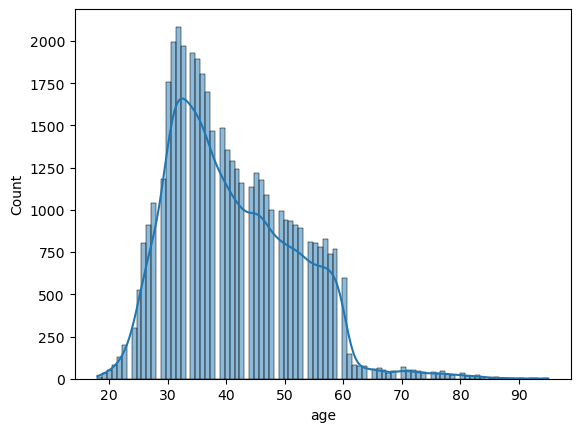

In [14]:
# draw a histogram to see the distribution of age column
sns.histplot(df['age'], kde=True)

Mean: 40.93621021432837
Median: 39.0
Mode: 32


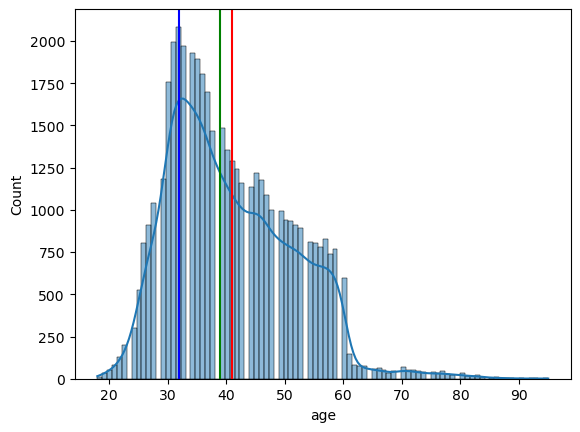

In [15]:
# plot the mean, median and mode of age column using sns
sns.histplot(df['age'], kde=True)
plt.axvline(df['age'].mean(), color='red')
plt.axvline(df['age'].median(), color='green')
plt.axvline(df['age'].mode()[0], color='blue')

# print the value of mean, median and mode of age column
print('Mean:', df['age'].mean())
print('Median:', df['age'].median())
print('Mode:', df['age'].mode()[0])

Let's explore the gender based distribution of the dataset for age column.

In [16]:
# plot the histogram of age column using plotly and coloring this by marital

fig = px.histogram(data_frame=df, x='age', color='marital')
fig.show()

In [17]:
# find the values of marital column
df['marital'].value_counts()

marital
married     27214
single      12790
divorced     5207
Name: count, dtype: int64

In [18]:
# calculate the percentages of single and married and divorced value counts in the data
married = 27214
single = 12790
divorced = 5207
total_count = married + single + divorced

# calculate percentages
married_percentage = (married / total_count) * 100
single_percentage = (single / total_count) * 100
divorced_percentage = (divorced / total_count) * 100

# display the results
print(f"married percentage in the data: {married_percentage:.2f}%")
print(f"single Percentage in the data: {single_percentage:.2f}%")
print(f"divorced Percentage in the data: {divorced_percentage:.2f}%")

married percentage in the data: 60.19%
single Percentage in the data: 28.29%
divorced Percentage in the data: 11.52%


In [20]:
# find the values count of age column grouping by marital column
df.groupby('marital')['age'].value_counts()

marital   age
divorced  46     193
          36     192
          35     186
          42     184
          44     184
                ... 
single    83       2
          70       1
          71       1
          77       1
          86       1
Name: count, Length: 197, dtype: int64

In [22]:
# Lets deal with education  column
# find the unique values in education  column
df['education'].unique()

array(['tertiary', 'secondary', 'unknown', 'primary'], dtype=object)

In [24]:
# find unique values count in education  column
df['education'].value_counts()

education
secondary    23202
tertiary     13301
primary       6851
unknown       1857
Name: count, dtype: int64

In [25]:
# better plots with plotly
fig = px.bar(df, x='education', color='marital')
fig.show()

# print the values count of education column grouped by marital
print(df.groupby('marital')['education'].value_counts())

marital   education
divorced  secondary     2815
          tertiary      1471
          primary        752
          unknown        169
married   secondary    13770
          tertiary      7038
          primary       5246
          unknown       1160
single    secondary     6617
          tertiary      4792
          primary        853
          unknown        528
Name: count, dtype: int64


In [26]:
# make a plot of age column using plotly and coloring this by dataset column
fig = px.histogram(data_frame=df, x='age', color='education')
fig.show()

# print the mean median and mode of age column grouped by education column
print(f"Mean of Data Set: {df.groupby('education')['age'].mean()}")
print("-------------------------------------")
print(f"Median of Data Set: {df.groupby('education')['age'].median()}")
print("-------------------------------------")
print(f"Mode of Data Set: {df.groupby('education')['age'].agg(pd.Series.mode)}")
print("-------------------------------------")

Mean of Data Set: education
primary      45.865567
secondary    39.964270
tertiary     39.593640
unknown      44.510501
Name: age, dtype: float64
-------------------------------------
Median of Data Set: education
primary      45.0
secondary    38.0
tertiary     37.0
unknown      45.0
Name: age, dtype: float64
-------------------------------------
Mode of Data Set: education
primary      45
secondary    32
tertiary     32
unknown      42
Name: age, dtype: int64
-------------------------------------


#### Let's explore balance column: 

In [27]:
# value count of cp column
df['balance'].value_counts()

balance
 0        3514
 1         195
 2         156
 4         139
 3         134
          ... 
-381         1
 4617        1
 20584       1
 4358        1
 16353       1
Name: count, Length: 7168, dtype: int64

<Axes: xlabel='balance', ylabel='count'>

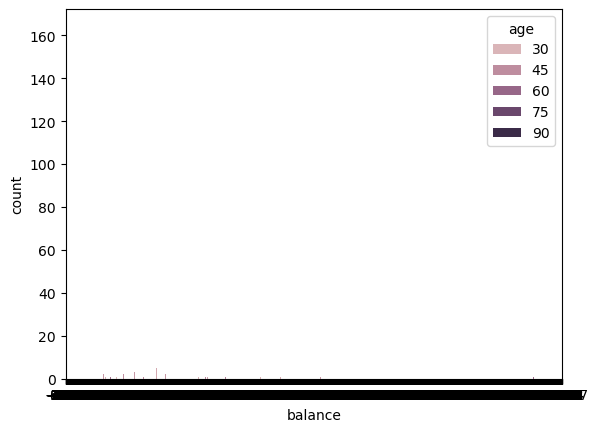

In [28]:
# count plot of balance column by age column
sns.countplot(df, x='balance', hue='age')

<Axes: xlabel='balance', ylabel='count'>

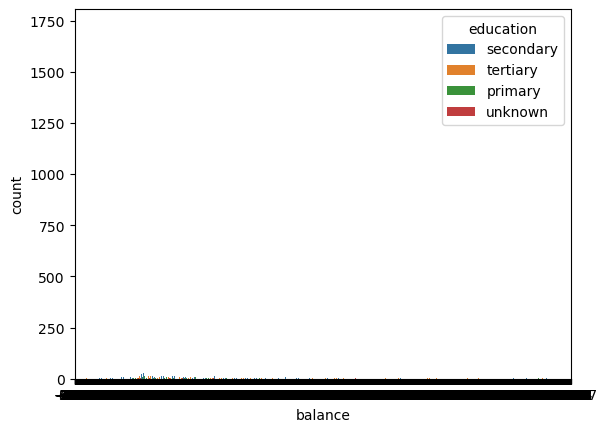

In [29]:
# count plot of balance column by education column
sns.countplot(df, x='balance', hue='education')

In [30]:
# draw the plot of age column grouped by age column using plotly
fig = px.histogram(data_frame=df, x='age', color='balance')
fig.show()

#### Let'e explore the housing  column:

In [31]:
# find the value counts of trestbps column
df['housing'].describe()

count     45211
unique        2
top         yes
freq      25130
Name: housing, dtype: object

<Axes: xlabel='housing', ylabel='Count'>

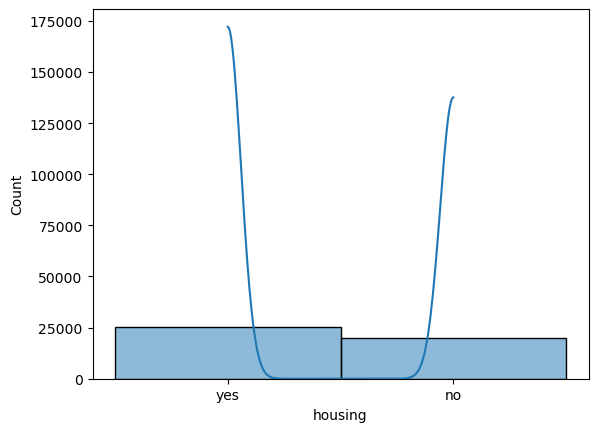

In [32]:
# create a histplot of trestbps column
sns.histplot(df['housing'], kde=True)

<span style="font-size: 350%; font-weight: bold;">Dealing with missing values</span>

We are going to make a function to deal with missing values.

In [33]:
df.isnull().sum()[df.isnull().sum() > 0].sort_values(ascending=False)
missing_data_cols = df.isnull().sum()[df.isnull().sum() > 0].index.tolist()
missing_data_cols

[]

There is no missing values in any column

<span style=" font-size: 350%; font-weight: bold;">Dealing with Outliers</span>

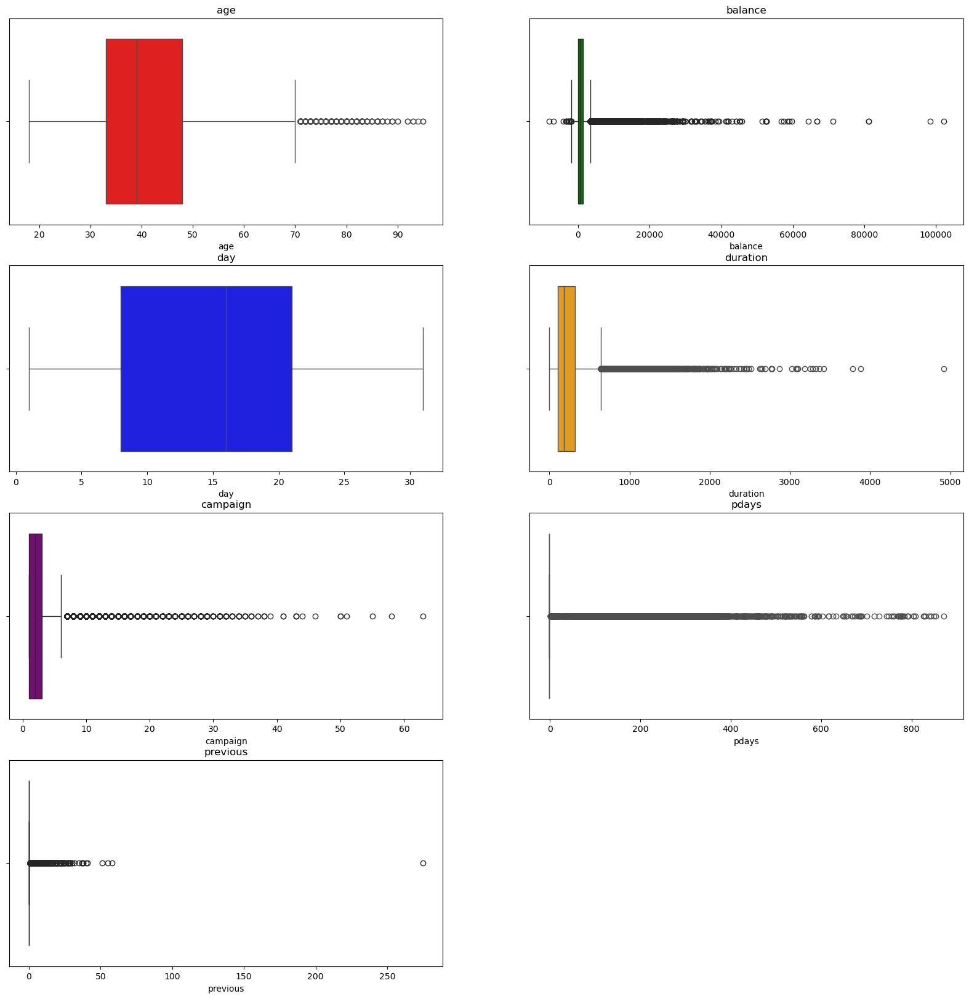

In [35]:
# create box plots for all numeric columns using for loop and subplot
plt.figure(figsize=(20, 20))

colors = ['red', 'green', 'blue', 'orange', 'purple','red', 'green']
numeric_cols = ['age','balance','day','duration','campaign','pdays','previous']

for i, col in enumerate(numeric_cols):
    plt.subplot(4, 2, i+1)
    sns.boxplot(x=df[col], color=colors[i])
    plt.title(col)
plt.show()

In [36]:
# make box plots of all the numeric columns using for loop and plotly
fig = px.box(data_frame=df, y='age')
fig.show()

fig = px.box(data_frame=df, y='balance')
fig.show()

fig = px.box(data_frame=df, y='day')
fig.show()

fig = px.box(data_frame=df, y='duration')
fig.show()

fig = px.box(data_frame=df, y='campaign')
fig.show()

fig = px.box(data_frame=df, y='pdays')
fig.show()

fig = px.box(data_frame=df, y='previous')
fig.show()

In [37]:
df.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no


<span style=" font-size: 350%; font-weight: bold;">Machine Learning</span>

In [38]:
df['y'].value_counts()

y
no     39922
yes     5289
Name: count, dtype: int64

The Target Column is `y` which is the predicted attribute. We will use this column to predict. 
The unique values in this column are: [0, 1].
* `0 = no`
* `1 = yes`

In [39]:
# split the data into X and y
X = df.drop('y', axis=1)
y = df['y']

# encode X data using separate label encoder for all categorical columns and save it for inverse transform
# Task: Separate Encoder for all cat and object columns and inverse transform at the end

label_encoder = LabelEncoder()

for col in X.columns:
    if X[col].dtype == 'object' or X[col].dtype == 'category':
        X[col] = label_encoder.fit_transform(X[col])
    else:
        pass

# split the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

Enlist all the models that you will use to predict the heart disease. These models should be classifiers for multi-class classification.

1. logistic regression
2. KNN
3. Decision Tree
4. Random Forest
5. GradientBoosting

In [40]:
# Models and their hyperparameter grids
models = [
    {
        'name': 'Logistic Regression',
        'estimator': LogisticRegression(random_state=42),
        'params': {
            'C': [0.01, 0.1, 1, 10, 100],
            'penalty': ['l1', 'l2', 'elasticnet'],
            'solver': ['lbfgs', 'liblinear', 'saga'],
            'max_iter': [100, 200]
        }
    },
    {
        'name': 'K-Nearest Neighbors',
        'estimator': KNeighborsClassifier(),
        'params': {
            'n_neighbors': [3, 5, 7, 9],
            'metric': ['euclidean', 'manhattan', 'minkowski'],
            'weights': ['uniform', 'distance']
        }
    },
    {
        'name': 'Decision Tree',
        'estimator': DecisionTreeClassifier(random_state=42),
        'params': {
            'max_depth': [5, 10, 20, None],
            'min_samples_split': [2, 5, 10],
            'min_samples_leaf': [1, 2, 4],
            'criterion': ['gini', 'entropy', 'log_loss']
        }
    },
    {
        'name': 'Random Forest',
        'estimator': RandomForestClassifier(random_state=42),
        'params': {
            'n_estimators': [100, 200, 300],
            'max_depth': [10, 20, 30, None],
            'min_samples_split': [2, 5, 10],
            'min_samples_leaf': [1, 2, 4],
            'criterion': ['gini', 'entropy', 'log_loss']
        }
    },
    {
        'name': 'Gradient Boosting',
        'estimator': GradientBoostingClassifier(random_state=42),
        'params': {
            'n_estimators': [100, 200, 300],
            'learning_rate': [0.01, 0.1, 0.2],
            'max_depth': [3, 5, 7],
            'subsample': [0.7, 0.8, 1.0]
        }
    }
]

best_models = []
best_accuracy = 0.0
best_model_name = ''

# Iterate over models, perform hyperparameter tuning, and evaluate
for model in models:
    clf = GridSearchCV(model['estimator'], model['params'], cv=5, scoring='accuracy')
    clf.fit(X_train, y_train)
    print(f"{model['name']} best parameters: {clf.best_params_}")
    y_pred = clf.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    print(f"{model['name']} Test Accuracy: {accuracy}\n")
    
    if accuracy > best_accuracy:
        best_accuracy = accuracy
        best_model_name = model['name']
        best_model = clf.best_estimator_

    best_models.append((model['name'], clf.best_estimator_))

# Print the best performing model
print(f"Best Model: {best_model_name} with an accuracy of {best_accuracy}")

Logistic Regression best parameters: {'C': 10, 'max_iter': 100, 'penalty': 'l2', 'solver': 'liblinear'}
Logistic Regression Test Accuracy: 0.8891182542023002

K-Nearest Neighbors best parameters: {'metric': 'manhattan', 'n_neighbors': 9, 'weights': 'distance'}
K-Nearest Neighbors Test Accuracy: 0.8848422294308463

Decision Tree best parameters: {'criterion': 'entropy', 'max_depth': 5, 'min_samples_leaf': 1, 'min_samples_split': 2}
Decision Tree Test Accuracy: 0.8950899439693306

Random Forest best parameters: {'criterion': 'gini', 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 300}
Random Forest Test Accuracy: 0.9031259215570628

Gradient Boosting best parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 200, 'subsample': 0.8}
Gradient Boosting Test Accuracy: 0.9062960778531407

Best Model: Gradient Boosting with an accuracy of 0.9062960778531407


#### Best model:
Gradient Boosting


### model Evluation 
`
printing Accuracy, F1, Precision, Recall, Roc_Auc, Classification_Report, Confusion Matrix, ROC
`
### For Gradient Boosting

In [46]:
accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='weighted')
conf_matrix = confusion_matrix(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
# For binary classification, calculate ROC AUC score
roc_auc = roc_auc_score(y_test, best_model.predict_proba(X_test)[:, 1]) if len(y.unique()) == 2 else 'Not applicable for multi-class'

classification_rep = classification_report(y_test, y_pred)

# Print evaluation metrics
print("Accuracy:", accuracy)
print("F1 Score:", f1)
print("Precision:", precision)
print("Recall:", recall)
print("ROC AUC Score:", roc_auc)
print("\nClassification Report:\n", classification_rep)

Accuracy: 0.6847826086956522
F1 Score: 0.6674268840378819
Precision: 0.6567595506175914
Recall: 0.6847826086956522
ROC AUC Score: Not applicable for multi-class

Classification Report:
               precision    recall  f1-score   support

           0       0.80      0.91      0.85       117
           1       0.69      0.66      0.67        87
           2       0.33      0.21      0.26        33
           3       0.49      0.56      0.52        34
           4       0.00      0.00      0.00         5

    accuracy                           0.68       276
   macro avg       0.46      0.47      0.46       276
weighted avg       0.66      0.68      0.67       276



In [48]:
# Plot the ROC curve for binary classification
if len(y.unique()) == 2:
    y_prob = best_model.predict_proba(X_test)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_prob)
    plt.figure()
    plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc="lower right")
    plt.show()
else:
    print("ROC Curve is not applicable for multi-class classification.")

ROC Curve is not applicable for multi-class classification.


saving the model

In [49]:
# save the best model

# pickle.dump(best_model, open('bankmarketing.pkl', 'wb'))